In [3]:
%load_ext autoreload
%autoreload 2
from rich.progress import Progress

from data import *
from models import *
from train import *

device = "cuda"
path = "../data/coco_sample/train_sample"
path_train = "../data/train2017"
path_test = "../data/test2017"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Pretvori slike u LAB prostor

In [4]:
trainloader, testloader = get_loaders_optimized(path_train, path_test, batch_size=64, num_workers=0)

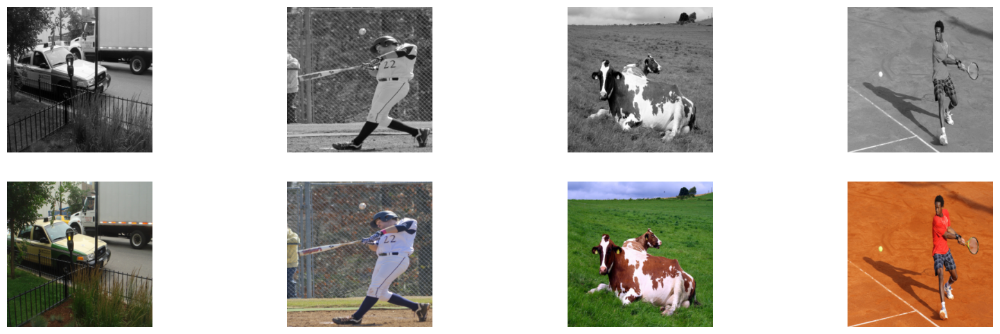

In [5]:
show_batch(testloader)

In [6]:
generator = UNet(1, 2).to(device)
#summary(generator, (1,256,256))

In [7]:
discriminator = Discriminator(3).to(device)
#summary(discriminator, [(1,256,256), (2,256,256)])

In [8]:
litmodel = LitModel(generator, discriminator)

Weights of UNet initialized using normal distribution with std: 0.02
Weights of Discriminator initialized using normal distribution with std: 0.02


In [1]:
def train(litmodel, epochs, trainloader, testloader, visualize_every=1, visualize=True, checkpoint_every=10):
    to_plot = next(iter(testloader))

    with Progress() as progress:
        outer_progress = progress.add_task("[bright_red]Epochs", total=epochs)
        inner_progress = progress.add_task("[purple4]Training", total=len(trainloader))

        for epoch in range(1, epochs + 1):
            progress.update(outer_progress, advance=1, description=f"[bright_red]Epochs {epoch}/{epochs}", refresh=True)
            i = 0
            running_gen_loss = 0
            running_disc_loss = 0
            for batch in trainloader:
                gen_loss, disc_loss = litmodel.training_step(batch)
                running_gen_loss += gen_loss
                running_disc_loss += disc_loss
                progress.update(inner_progress, advance=1,
                                description=f"[purple4]Training [Gen Loss: {running_gen_loss / (i + 1):.4f}] [Disc Loss: {running_disc_loss / (i + 1):.4f}]",
                                refresh=True)
                progress.refresh()
                i += 1

            progress.reset(inner_progress, total=len(trainloader))
            if visualize and (epoch % visualize_every == 0 or epoch == 1):
                print(f"Epoch {epoch}/{epochs}")
                litmodel.visualize(to_plot)

            if epoch % checkpoint_every == 0:
                litmodel.save_model(f"models/seed/generator_{epoch}.pth")
            elif epoch == epochs:
                litmodel.save_model(f"models/seed/generator_{epoch}.pth", f"models/seed/discriminator_{epoch}.pth")

In [1]:
#litmodel.load_model("models/seed/generator_200.pth")
train(litmodel, 500, trainloader, testloader, checkpoint_every=20)

NameError: name 'train' is not defined

C:\Users\fpankretic\dev\colorization\simpler_implementation\data.py:57: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  rgb = color.lab2rgb(lab)


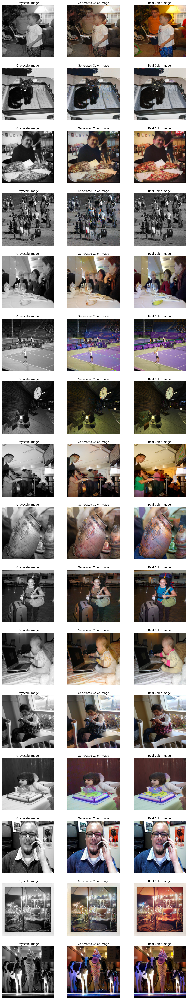

In [ ]:
visualize(litmodel.generator, trainloader, n=16, transpose=True)